In [2]:
import warnings
warnings.filterwarnings('ignore')

import os
import sys
import tarfile
from glob import glob
import csv
import gc
import time
import random
from io import BytesIO
from zipfile import ZipFile
from urllib.request import urlopen
import timm
import itertools 
import json
import functools

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image, ImageOps, UnidentifiedImageError
import cv2
from collections import Counter, defaultdict, namedtuple

from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.manifold import TSNE
from sklearn.metrics import (
    confusion_matrix,
    roc_curve,
    auc,
    f1_score,
    precision_score,
    recall_score,
    accuracy_score,
)

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn.functional import normalize
import torch.optim as optim
from torch.autograd import Variable
from torch.optim import lr_scheduler
from torch.utils.data import Dataset, DataLoader
from torch.nn.utils import clip_grad_norm_
from torchinfo import summary as Summary

import torchvision.models as models
from torchvision import transforms, datasets
from torchvision.transforms.functional import InterpolationMode
from torchvision.transforms import v2
import torchvision.transforms.functional as TF
from torchvision.transforms import Compose, ToTensor, Normalize
from torch.utils.tensorboard import SummaryWriter

import albumentations as A
from albumentations.pytorch import ToTensorV2

from torchvision.transforms import ToPILImage
from torchmetrics.image import PeakSignalNoiseRatio, StructuralSimilarityIndexMeasure

from torchvision.transforms.functional import to_pil_image
import torchvision.utils as vutils
from torchvision.utils import make_grid, save_image, draw_bounding_boxes, draw_segmentation_masks
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

print('All modules imported succesfully !')


torch.cuda.empty_cache()

print("CUDA Available:", torch.cuda.is_available())
print("CUDA Device Count:", torch.cuda.device_count())
print(f"Device : { 'cuda' if torch.cuda.is_available() else 'cpu'}")
device = 'cuda' if torch.cuda.is_available() else 'cpu'

All modules imported succesfully !
CUDA Available: True
CUDA Device Count: 1
Device : cuda


In [3]:
class FaceMaskRemovalDataset(Dataset):
    def __init__(self, root_dir, transform=None, num_samples=None):
        self.masked_dir = os.path.join(root_dir, 'masked_images')
        self.original_dir = os.path.join(root_dir, 'original_images')
        self.mask_dir = os.path.join(root_dir, 'binary_masks')
        self.transform = transform
        self.paired_images = self._get_paired_images(num_samples)

    def _get_paired_images(self, num_samples=None):
        masked_images = glob(os.path.join(self.masked_dir, "*.jpg"))
        pairs = []
        if num_samples is not None:
            masked_images = masked_images[:min(len(masked_images), num_samples)]
        for masked_path in tqdm(masked_images):
            filename = os.path.basename(masked_path).split("_")[0] + ".jpg"
            original_path = os.path.join(self.original_dir, filename)
            mask_path = os.path.join(self.mask_dir, os.path.basename(masked_path).replace(".jpg", "_binary.jpg"))
            if os.path.exists(original_path) and os.path.exists(mask_path):
                pairs.append((masked_path, original_path, mask_path))
        return pairs

    def __len__(self):
        return len(self.paired_images)

    def __getitem__(self, idx):
        masked_path, original_path, mask_path = self.paired_images[idx]
    
        masked_img = Image.open(masked_path).convert("RGB")
        original_img = Image.open(original_path).convert("RGB")
        mask_img = Image.open(mask_path).convert("L")
    
        masked_img = np.array(masked_img)
        original_img = np.array(original_img)
        mask_img = np.array(mask_img)
    
        if self.transform:
            augmented = self.transform(image=masked_img, image0=original_img, mask=mask_img)
            masked_img = augmented["image"]
            original_img = augmented["image0"]
            mask_img = augmented["mask"]
    
        mask_img = mask_img.unsqueeze(0).float()  # (1, H, W)
        masked_input = torch.cat([masked_img, mask_img], dim=0)  # (4, H, W)
    
        return {
            'image': original_img,  # (3, H, W)
            'masked_input': masked_input,  # (4, H, W)
            'mask': mask_img,  # (1, H, W)
            'masked_image': masked_img  # (3, H, W)
        }


# Parameters
image_size = 64

transform = A.Compose(
    [
        A.Resize(image_size, image_size),
        A.HorizontalFlip(p=0.5),
        A.Rotate(limit=10),
        A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
        ToTensorV2(),
    ],
    additional_targets={"image0": "image", "mask": "mask"},
)

dataset = FaceMaskRemovalDataset(
    root_dir='/kaggle/input/gan-dataset-with-masks/image_align_celeba_with_masks',
    transform=transform,
    num_samples=50000,
)

100%|██████████| 50000/50000 [03:16<00:00, 255.03it/s]


In [4]:
batch_size = 128 
transform = A.Compose([
    A.Resize(image_size, image_size),
    A.HorizontalFlip(p=0.5),
    A.Rotate(limit=10),
    A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
    ToTensorV2(),
], additional_targets={"image0": "image", "mask": "mask"}) 


# Split into train and validation
train_size = int(0.9 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])

train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=4,
    pin_memory=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=False,
    num_workers=4,
    pin_memory=True
)

In [5]:
class Vgg16(torch.nn.Module):
    def __init__(self):
        super(Vgg16, self).__init__()
        features = models.vgg16(pretrained=True).features
        self.relu1_1 = torch.nn.Sequential()
        self.relu1_2 = torch.nn.Sequential()

        self.relu2_1 = torch.nn.Sequential()
        self.relu2_2 = torch.nn.Sequential()

        self.relu3_1 = torch.nn.Sequential()
        self.relu3_2 = torch.nn.Sequential()
        self.relu3_3 = torch.nn.Sequential()
        self.max3 = torch.nn.Sequential()


        self.relu4_1 = torch.nn.Sequential()
        self.relu4_2 = torch.nn.Sequential()
        self.relu4_3 = torch.nn.Sequential()


        self.relu5_1 = torch.nn.Sequential()
        self.relu5_2 = torch.nn.Sequential()
        self.relu5_3 = torch.nn.Sequential()

        for x in range(2):
            self.relu1_1.add_module(str(x), features[x])

        for x in range(2, 4):
            self.relu1_2.add_module(str(x), features[x])

        for x in range(4, 7):
            self.relu2_1.add_module(str(x), features[x])

        for x in range(7, 9):
            self.relu2_2.add_module(str(x), features[x])

        for x in range(9, 12):
            self.relu3_1.add_module(str(x), features[x])

        for x in range(12, 14):
            self.relu3_2.add_module(str(x), features[x])

        for x in range(14, 16):
            self.relu3_3.add_module(str(x), features[x])
        for x in range(16, 17):
            self.max3.add_module(str(x), features[x])

        for x in range(17, 19):
            self.relu4_1.add_module(str(x), features[x])

        for x in range(19, 21):
            self.relu4_2.add_module(str(x), features[x])

        for x in range(21, 23):
            self.relu4_3.add_module(str(x), features[x])

        for x in range(23, 26):
            self.relu5_1.add_module(str(x), features[x])

        for x in range(26, 28):
            self.relu5_2.add_module(str(x), features[x])

        for x in range(28, 30):
            self.relu5_3.add_module(str(x), features[x])


        for param in self.parameters():
            param.requires_grad = False

    def forward(self, x):
        relu1_1 = self.relu1_1(x)
        relu1_2 = self.relu1_2(relu1_1)

        relu2_1 = self.relu2_1(relu1_2)
        relu2_2 = self.relu2_2(relu2_1)

        relu3_1 = self.relu3_1(relu2_2)
        relu3_2 = self.relu3_2(relu3_1)
        relu3_3 = self.relu3_3(relu3_2)
        max_3 = self.max3(relu3_3)


        relu4_1 = self.relu4_1(max_3)
        relu4_2 = self.relu4_2(relu4_1)
        relu4_3 = self.relu4_3(relu4_2)


        relu5_1 = self.relu5_1(relu4_3)
        relu5_2 = self.relu5_1(relu5_1)
        relu5_3 = self.relu5_1(relu5_2)
        out = {
            'relu1_1': relu1_1,
            'relu1_2': relu1_2,

            'relu2_1': relu2_1,
            'relu2_2': relu2_2,

            'relu3_1': relu3_1,
            'relu3_2': relu3_2,
            'relu3_3': relu3_3,
            'max_3':max_3,


            'relu4_1': relu4_1,
            'relu4_2': relu4_2,
            'relu4_3': relu4_3,


            'relu5_1': relu5_1,
            'relu5_2': relu5_2,
            'relu5_3': relu5_3,
        }
        return out


class PerceptualLoss(nn.Module):
    def __init__(self, weights=[1.0, 1.0, 1.0, 1.0, 1.0]):
        super(PerceptualLoss, self).__init__()
        self.add_module('vgg', Vgg16().cuda())
        self.criterion = torch.nn.L1Loss()
        self.weights = weights
        self.vgg_normalize = transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )

    def preprocess(self, x):
        x = (x + 1) / 2  # from [-1, 1] -> [0, 1]
        return self.vgg_normalize(x)

    def __call__(self, x, y):
        x = self.preprocess(x)
        y = self.preprocess(y)

        x_vgg, y_vgg = self.vgg(x), self.vgg(y)

        content_loss = 0.0
        content_loss += self.weights[0] * self.criterion(x_vgg['relu1_1'], y_vgg['relu1_1'])
        content_loss += self.weights[1] * self.criterion(x_vgg['relu2_1'], y_vgg['relu2_1'])
        content_loss += self.weights[2] * self.criterion(x_vgg['relu3_1'], y_vgg['relu3_1'])
        content_loss += self.weights[3] * self.criterion(x_vgg['relu4_1'], y_vgg['relu4_1'])
        content_loss += self.weights[4] * self.criterion(x_vgg['relu5_1'], y_vgg['relu5_1'])

        return content_loss

In [6]:
class PartialConv2d(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride=1, 
                 padding=0, dilation=1, groups=1, bias=True, multi_channel=False, return_mask=True):
        """
        Partial Convolution Layer as per NVIDIA's implementation
        
        Args:
            multi_channel (bool): Whether to use multi-channel masking
            return_mask (bool): Whether to return updated mask alongside output
        """
        super().__init__()
        
        # Main convolution
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, 
                               stride=stride, padding=padding, 
                               dilation=dilation, groups=groups, bias=bias)
        
        # Mask convolution (fixed weights)
        self.multi_channel = multi_channel
        self.return_mask = return_mask
        
        # Create mask updater
        if multi_channel:
            self.mask_conv_weight = torch.ones(out_channels, in_channels, *self.conv.weight.shape[2:])
        else:
            self.mask_conv_weight = torch.ones(out_channels, 1, *self.conv.weight.shape[2:])
        
        # Fix mask convolution weights and prevent gradient updates
        self.mask_conv = nn.Conv2d(in_channels if not multi_channel else in_channels, 
                                   out_channels, kernel_size, 
                                   stride=stride, padding=padding, 
                                   dilation=dilation, groups=1, bias=False)
        self.mask_conv.weight.data.fill_(1.0)
        self.mask_conv.weight.requires_grad = False
        
        self.slide_winsize = kernel_size[0] * kernel_size[1] if isinstance(kernel_size, tuple) else kernel_size**2

    def forward(self, input, mask=None):
        # If no mask provided, create a default all-ones mask
        if mask is None:
            if self.multi_channel:
                mask = torch.ones_like(input)
            else:
                mask = torch.ones(1, 1, input.shape[2], input.shape[3], 
                                  device=input.device, dtype=input.dtype)
        
        # Ensure mask is the right shape
        if mask.shape[1] == 1 and self.multi_channel:
            mask = mask.repeat(1, input.shape[1], 1, 1)
        
        # Apply mask to input
        input_masked = input * mask
        
        # Convolve input
        output = self.conv(input_masked)
        
        # Compute mask update
        with torch.no_grad():
            # Convolve mask
            mask_output = self.mask_conv(mask)
            
            # Normalize mask
            mask_output = torch.clamp(mask_output, 0, 1)
            
            # Compute mask ratio (how much of the convolution window is valid)
            mask_ratio = self.slide_winsize / (mask_output + 1e-8)
            mask_ratio = torch.mul(mask_ratio, mask_output)
        
        # Normalize output based on mask
        output = torch.mul(output, mask_ratio)
        
        # Add bias if exists (accounting for mask)
        if self.conv.bias is not None:
            bias_view = self.conv.bias.view(1, -1, 1, 1)
            output = torch.mul(output - bias_view, mask_output) + bias_view
        
        if self.return_mask:
            return output, mask_output
        return output

class PDUNet(nn.Module):
    def __init__(self, in_channels=4, out_channels=3, base_channels=64):
        super().__init__()
        
        # Encoder (Reduced layers)
        self.enc1 = PartialConv2d(in_channels, base_channels, kernel_size=4, stride=2, padding=1, multi_channel=True)
        self.enc2 = PartialConv2d(base_channels, base_channels*2, kernel_size=4, stride=2, padding=1, multi_channel=True)
        self.enc3 = PartialConv2d(base_channels*2, base_channels*4, kernel_size=4, stride=2, padding=1, multi_channel=True)
        
        # Middle
        self.mid = PartialConv2d(base_channels*4, base_channels*4, kernel_size=3, padding=1, multi_channel=True)
        
        # Decoder
        self.dec3 = nn.ConvTranspose2d(base_channels*8, base_channels*2, kernel_size=4, stride=2, padding=1)
        self.dec2 = nn.ConvTranspose2d(base_channels*4, base_channels, kernel_size=4, stride=2, padding=1)
        self.dec1 = nn.ConvTranspose2d(base_channels*2, out_channels, kernel_size=4, stride=2, padding=1)
        
        # Normalization
        self.norm1 = nn.InstanceNorm2d(base_channels)
        self.norm2 = nn.InstanceNorm2d(base_channels*2)
        self.norm4 = nn.InstanceNorm2d(base_channels*4)
        
    def forward(self, x, mask):
        # Encoder
        e1, m1 = self.enc1(x, mask)
        e1 = F.leaky_relu(self.norm1(e1), 0.2)
        
        e2, m2 = self.enc2(e1, m1)
        e2 = F.leaky_relu(self.norm2(e2), 0.2)
        
        e3, m3 = self.enc3(e2, m2)
        e3 = F.leaky_relu(self.norm4(e3), 0.2)
        
        # Middle
        mid, m_mid = self.mid(e3, m3)
        mid = F.leaky_relu(self.norm4(mid), 0.2)
        
        # Decoder with skip connections
        d3 = F.leaky_relu(self.norm2(self.dec3(torch.cat([mid, e3], 1))), 0.2)
        d2 = F.leaky_relu(self.norm1(self.dec2(torch.cat([d3, e2], 1))), 0.2)
        d1 = torch.tanh(self.dec1(torch.cat([d2, e1], 1)))
        
        return d1

In [ ]:
class PatchDiscriminator(nn.Module):
    def __init__(self, in_channels=3):
        super().__init__()
        
        def discriminator_block(in_filters, out_filters, normalize=True):
            layers = [nn.Conv2d(in_filters, out_filters, 4, stride=2, padding=1)]
            if normalize:
                layers.append(nn.InstanceNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *discriminator_block(in_channels, 64, normalize=False),  # 64->32
            *discriminator_block(64, 128),                          # 32->16
            *discriminator_block(128, 256),                         # 16->8
            nn.Conv2d(256, 1, kernel_size=3, padding=1),           # 8->8
            nn.Sigmoid()
        )

    def forward(self, img):
        return self.model(img)

In [7]:
class InpaintingTrainer:
    def __init__(self, unet, device, lambda_l1=1.0, lambda_recon=10.0, lambda_perceptual=0.1):
        """
        Initialize the InpaintingTrainer for direct U-Net training without GAN components
        
        Args:
            unet: U-Net model (PartialUNet)
            device: Device to use for training ('cuda' or 'cpu')
            lambda_l1: Weight for L1 loss
            lambda_recon: Weight for reconstruction loss
            lambda_perceptual: Weight for perceptual loss
        """
        self.unet = unet.to(device)
        self.device = device
        self.l1_loss = nn.L1Loss()
        self.perceptual_loss = PerceptualLoss()
        self.lambda_l1 = lambda_l1
        self.lambda_recon = lambda_recon
        self.lambda_perceptual = lambda_perceptual
        
    def compute_batch_psnr(self, real_batch, fake_batch):
        real_batch = real_batch.clamp(-1, 1).detach().cpu().numpy()
        fake_batch = fake_batch.clamp(-1, 1).detach().cpu().numpy()
    
        real_batch = (real_batch + 1) / 2  # Rescale to [0, 1]
        fake_batch = (fake_batch + 1) / 2
    
        psnr_values = []
        for i in range(real_batch.shape[0]):
            psnr = peak_signal_noise_ratio(real_batch[i].transpose(1, 2, 0), fake_batch[i].transpose(1, 2, 0), data_range=1.0)
            psnr_values.append(psnr)
    
        return np.mean(psnr_values)

    def compute_batch_ssim(self, real_batch, fake_batch):
        real_batch = real_batch.clamp(-1, 1).detach().cpu().numpy()
        fake_batch = fake_batch.clamp(-1, 1).detach().cpu().numpy()
    
        real_batch = (real_batch + 1) / 2  # Rescale to [0, 1]
        fake_batch = (fake_batch + 1) / 2
    
        ssim_values = []
        for i in range(real_batch.shape[0]):
            ssim_value = structural_similarity(
                real_batch[i].transpose(1, 2, 0),
                fake_batch[i].transpose(1, 2, 0),
                multichannel=True,
                data_range=1.0,
                win_size=3
            )
            ssim_values.append(ssim_value)
    
        return np.mean(ssim_values)
    
    def train_step(self, batch, optimizer):
        real_images = batch['image'].to(self.device)
        masked_inputs = batch['masked_input'].to(self.device)
        masks = batch['mask'].float().to(self.device) / 255.0
    
        # Train U-Net
        self.unet.train()
        fake_images = self.unet(masked_inputs, masks)
    
        # L1 loss
        g_l1_loss = self.l1_loss(fake_images, real_images)
    
        # Expand mask to match image channels for reconstruction loss
        masks_expanded = masks.expand_as(real_images)
    
        # Reconstruction loss on masked region
        im_recon = real_images * (1 - masks_expanded) + fake_images * masks_expanded
        g_recon_loss = self.l1_loss(real_images * masks_expanded, im_recon * masks_expanded)
        
        # Perceptual Loss
        g_perceptual_loss = self.perceptual_loss(fake_images, real_images)
    
        # Combined loss
        total_loss = (
            self.lambda_l1 * g_l1_loss
            + self.lambda_recon * g_recon_loss
            + self.lambda_perceptual * g_perceptual_loss
        )
    
        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()
    
        # Compute metrics
        batch_psnr = self.compute_batch_psnr(real_images, fake_images)
        batch_ssim = self.compute_batch_ssim(real_images, fake_images)
    
        return {
            'total_loss': total_loss.item(),
            'l1_loss': g_l1_loss.item(),
            'recon_loss': g_recon_loss.item(),
            'perceptual_loss': g_perceptual_loss.item(),
            'psnr': batch_psnr,
            'ssim': batch_ssim,
            'fake_images': fake_images.detach()
        }
    
    def train_epoch(self, dataloader, optimizer):
        epoch_metrics = {
            'total_loss': 0,
            'l1_loss': 0,
            'recon_loss': 0,
            'perceptual_loss': 0,
            'psnr': 0,
            'ssim': 0
        }
    
        pbar = tqdm(dataloader, desc="Training")
        for batch in pbar:
            metrics = self.train_step(batch, optimizer)
    
            for key in epoch_metrics:
                epoch_metrics[key] += metrics[key]
    
            avg_metrics = {k: v / (pbar.n + 1) for k, v in epoch_metrics.items()}
            pbar.set_postfix({k: f"{v:.4f}" for k, v in avg_metrics.items()})
    
        return {k: v / len(dataloader) for k, v in epoch_metrics.items()}

    def validate_epoch(self, dataloader):
        self.unet.eval()
    
        val_metrics = {
            'total_loss': 0,
            'l1_loss': 0,
            'recon_loss': 0,
            'perceptual_loss': 0,
            'psnr': 0,
            'ssim': 0
        }
    
        pbar = tqdm(dataloader, desc="Validating")
        with torch.no_grad():
            for batch in pbar:
                real_images = batch['image'].to(self.device)
                masked_inputs = batch['masked_input'].to(self.device)
                masks = batch['mask'].float().to(self.device) / 255.0
    
                fake_images = self.unet(masked_inputs, masks)
    
                # L1 loss
                g_l1_loss = self.l1_loss(fake_images, real_images)
    
                # Expand mask to match image channels
                masks_expanded = masks.expand_as(real_images)
    
                # Reconstruction loss on masked region
                im_recon = real_images * (1 - masks_expanded) + fake_images * masks_expanded
                g_recon_loss = self.l1_loss(real_images * masks_expanded, im_recon * masks_expanded)

                # Perceptual Loss
                g_perceptual_loss = self.perceptual_loss(fake_images, real_images)
    
                # Combined loss
                total_loss = (
                    self.lambda_l1 * g_l1_loss
                    + self.lambda_recon * g_recon_loss
                    + self.lambda_perceptual * g_perceptual_loss
                )
    
                batch_psnr = self.compute_batch_psnr(real_images, fake_images)
                batch_ssim = self.compute_batch_ssim(real_images, fake_images)
    
                val_metrics['total_loss'] += total_loss.item()
                val_metrics['l1_loss'] += g_l1_loss.item()
                val_metrics['recon_loss'] += g_recon_loss.item()
                val_metrics['perceptual_loss'] += g_perceptual_loss.item()
                val_metrics['psnr'] += batch_psnr
                val_metrics['ssim'] += batch_ssim
    
                avg_metrics = {k: v / (pbar.n + 1) for k, v in val_metrics.items()}
                pbar.set_postfix({k: f"{v:.4f}" for k, v in avg_metrics.items()})
    
        return {k: v / len(dataloader) for k, v in val_metrics.items()}

    def visualize_batch(self, batch, save_path=None, num_images=8):
        """
        Visualize a batch of images:
        - Original Image
        - Masked Input
        - Binary Mask
        - Model Output (Generated)
        - Reconstructed Image (Blended)
        """
        self.unet.eval()
        with torch.no_grad():
            real_images = batch['image'][:num_images].to(self.device)
            masked_inputs = batch['masked_input'][:num_images].to(self.device)
            masks = batch['mask'][:num_images].float().to(self.device) / 255.0
    
            # Generate output
            generated_images = self.unet(masked_inputs, masks)
    
            # Expand mask to 3 channels for visualization
            masks_vis = masks.repeat(1, 3, 1, 1)
    
            # Extract RGB part of masked input for visualization
            masked_images = masked_inputs[:, :3, :, :]
    
            # Reconstructed image (real + inpainted region)
            masks_expanded = masks.expand_as(real_images)
            im_recon = real_images * (1 - masks_expanded) + generated_images * masks_expanded
    
            # Denormalize images for visualization
            def denorm(x):
                return (x + 1) / 2
    
            real_images = denorm(real_images)
            masked_images = denorm(masked_images)
            generated_images = denorm(generated_images)
            im_recon = denorm(im_recon)
    
            # Create visualization grid (Original | Masked | Mask | Output | Reconstructed)
            vis_images = torch.cat([real_images, masked_images, masks_vis, generated_images, im_recon], dim=0)
    
            # Make grid
            grid = make_grid(vis_images, nrow=num_images, padding=2, normalize=False)
    
            # Convert to numpy for plotting
            grid_np = grid.cpu().numpy().transpose((1, 2, 0))
    
            # Plot
            plt.figure(figsize=(15, 7))
            plt.imshow(grid_np)
            plt.axis('off')
            plt.title("Original | Masked Input | Mask | Model Output | Reconstructed Image")
    
            if save_path:
                plt.savefig(save_path, bbox_inches='tight', pad_inches=0.1)
                plt.show()
                plt.close()
            else:
                plt.show()
    
    def save_checkpoint(self, path, epoch, optimizer, metrics_history):
        """Save model checkpoint"""
        os.makedirs(os.path.dirname(path), exist_ok=True)
        torch.save({
            'epoch': epoch,
            'unet_state_dict': self.unet.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'metrics_history': metrics_history
        }, path)
        
    def load_checkpoint(self, path, optimizer=None):
        """Load model checkpoint"""
        checkpoint = torch.load(path)
        self.unet.load_state_dict(checkpoint['unet_state_dict'])
        
        if optimizer:
            optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
            
        return (checkpoint['epoch'],
                checkpoint.get('metrics_history', {'train_metrics': [], 'val_metrics': []}))

In [8]:
def train_model(trainer, train_loader, val_loader, optimizer, 
                num_epochs, save_dir, save_freq=5, viz_freq=1, resume_path=None):
    """
    Training function for U-Net inpainting model with validation and visualization.

    Args:
        trainer: InpaintingTrainer instance
        train_loader: Training data loader
        val_loader: Validation data loader
        optimizer: U-Net optimizer
        num_epochs: Number of epochs to train
        save_dir: Directory to save checkpoints and visualizations
        save_freq: Frequency of saving checkpoints
        viz_freq: Frequency of saving visualizations
        resume_path: Path to resume training from checkpoint
    """
    metrics_history = {'train_metrics': [], 'val_metrics': []}
    start_epoch = 0
    best_loss = float('inf')
    
    # Create directories
    os.makedirs(save_dir, exist_ok=True)
    vis_dir = os.path.join(save_dir, 'visualizations')
    os.makedirs(vis_dir, exist_ok=True)

    csv_path = os.path.join(save_dir, 'training_log.csv')

    # CSV header
    csv_header = [
        'epoch', 'train_total_loss', 'train_l1_loss', 'train_recon_loss', 'train_perceptual_loss', 'train_psnr', 'train_ssim',
        'val_total_loss', 'val_l1_loss', 'val_recon_loss', 'val_perceptual_loss', 'val_psnr', 'val_ssim'
    ]

    # Open CSV file for logging
    csv_file = open(csv_path, 'a', newline='')
    csv_writer = csv.writer(csv_file)

    # Write CSV header only if the file is empty
    if os.stat(csv_path).st_size == 0:
        csv_writer.writerow(csv_header)
    
    if resume_path and os.path.exists(resume_path):
        print(f"Resuming training from {resume_path}")
        start_epoch, metrics_history = trainer.load_checkpoint(
            resume_path, optimizer)
        print(f"Resumed from epoch {start_epoch}")
    
    for epoch in range(start_epoch, start_epoch + num_epochs):
        print(f"\nEpoch {epoch+1}/{start_epoch + num_epochs}")
        
        # Training
        train_metrics = trainer.train_epoch(train_loader, optimizer)
        metrics_history['train_metrics'].append(train_metrics)
        
        # Validation
        val_metrics = trainer.validate_epoch(val_loader)
        metrics_history['val_metrics'].append(val_metrics)
        
        # Print metrics at the end of training
        if epoch == start_epoch + num_epochs - 1:
            print("\nTraining metrics:")
            for k, v in train_metrics.items():
                print(f"{k}: {v:.4f}")
            print("\nValidation metrics:")
            for k, v in val_metrics.items():
                print(f"{k}: {v:.4f}")
        
        # Write metrics to CSV
        csv_writer.writerow([
            epoch + 1,
            train_metrics['total_loss'], train_metrics['l1_loss'], train_metrics['recon_loss'], 
            train_metrics['perceptual_loss'], train_metrics['psnr'], train_metrics['ssim'],
            val_metrics['total_loss'], val_metrics['l1_loss'], val_metrics['recon_loss'], 
            val_metrics['perceptual_loss'], val_metrics['psnr'], val_metrics['ssim'],
        ])
        csv_file.flush()  # Ensure data is written to the file
        
        # Save best model
        if val_metrics['total_loss'] < best_loss:
            best_loss = val_metrics['total_loss']
            best_path = os.path.join(save_dir, "best_model.pth")
            trainer.save_checkpoint(best_path, epoch + 1, optimizer, metrics_history)
            print(f"Best model saved: {best_path}")
        
        # Regular checkpoint saving
        if (epoch + 1) % save_freq == 0:
            save_path = os.path.join(save_dir, f"regular_checkpoint.pth")
            trainer.save_checkpoint(save_path, epoch + 1, optimizer, metrics_history)
            print(f"Checkpoint saved: {save_path}")
        
        # Visualization
        if (epoch + 1) % viz_freq == 0:
            viz_path = os.path.join(vis_dir, f'epoch_{epoch+1:03d}.png')
            trainer.visualize_batch(next(iter(val_loader)), save_path=viz_path)
            print(f"Visualization saved: {viz_path}")
        
        # Memory cleanup
        gc.collect()
        if trainer.device == 'cuda':
            torch.cuda.empty_cache()

    # Close CSV file
    csv_file.close()

    # Save final model
    final_path = os.path.join(save_dir, "final_model.pth")
    trainer.save_checkpoint(final_path, epoch + 1, optimizer, metrics_history)
    print(f"Final model saved: {final_path}")

    print(f"Training log saved to {csv_path}")

Resuming training from /kaggle/working/checkpoints_run2/best_model.pth
Resumed from epoch 52

Epoch 53/82


Validating: 100%|██████████| 40/40 [00:23<00:00,  1.67it/s, total_loss=17.4192, l1_loss=0.4658, recon_loss=0.0258, perceptual_loss=6.3739, psnr=11.4708, ssim=0.3681]


Best model saved: /kaggle/working/checkpoints_run3/best_model.pth

Epoch 54/82


Validating: 100%|██████████| 40/40 [00:17<00:00,  2.31it/s, total_loss=17.4142, l1_loss=0.4633, recon_loss=0.0256, perceptual_loss=6.3844, psnr=11.5154, ssim=0.3721]


Best model saved: /kaggle/working/checkpoints_run3/best_model.pth
Checkpoint saved: /kaggle/working/checkpoints_run3/regular_checkpoint.pth


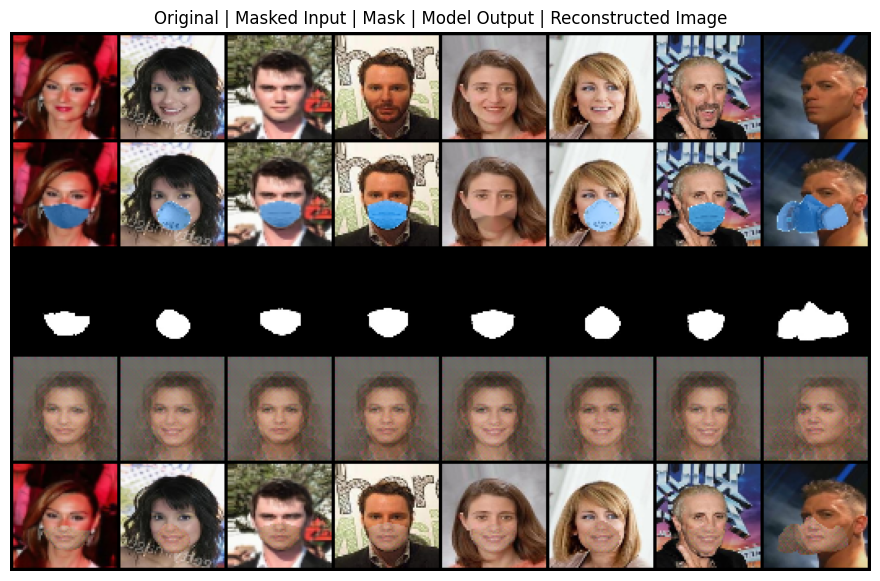

Visualization saved: /kaggle/working/checkpoints_run3/visualizations/epoch_054.png

Epoch 55/82


Validating: 100%|██████████| 40/40 [00:16<00:00,  2.39it/s, total_loss=17.4067, l1_loss=0.4618, recon_loss=0.0255, perceptual_loss=6.3879, psnr=11.5448, ssim=0.3736]


Best model saved: /kaggle/working/checkpoints_run3/best_model.pth

Epoch 56/82


Validating: 100%|██████████| 40/40 [00:16<00:00,  2.38it/s, total_loss=17.3846, l1_loss=0.4581, recon_loss=0.0254, perceptual_loss=6.3956, psnr=11.5910, ssim=0.3756]


Best model saved: /kaggle/working/checkpoints_run3/best_model.pth
Checkpoint saved: /kaggle/working/checkpoints_run3/regular_checkpoint.pth


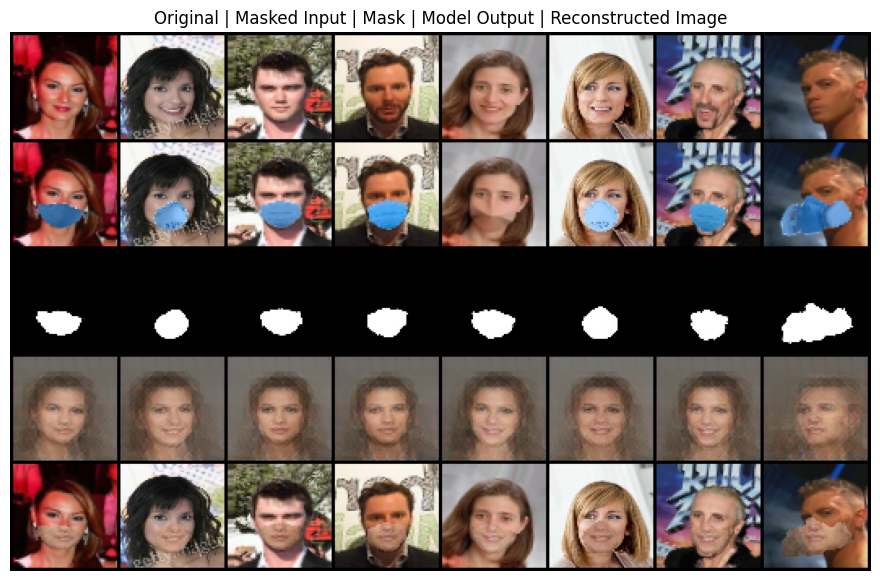

Visualization saved: /kaggle/working/checkpoints_run3/visualizations/epoch_056.png

Epoch 57/82


Validating: 100%|██████████| 40/40 [00:17<00:00,  2.29it/s, total_loss=17.3326, l1_loss=0.4537, recon_loss=0.0252, perceptual_loss=6.3914, psnr=11.6663, ssim=0.3756]


Best model saved: /kaggle/working/checkpoints_run3/best_model.pth

Epoch 58/82


Validating: 100%|██████████| 40/40 [00:17<00:00,  2.33it/s, total_loss=17.2962, l1_loss=0.4486, recon_loss=0.0252, perceptual_loss=6.3990, psnr=11.7577, ssim=0.3762]


Best model saved: /kaggle/working/checkpoints_run3/best_model.pth
Checkpoint saved: /kaggle/working/checkpoints_run3/regular_checkpoint.pth


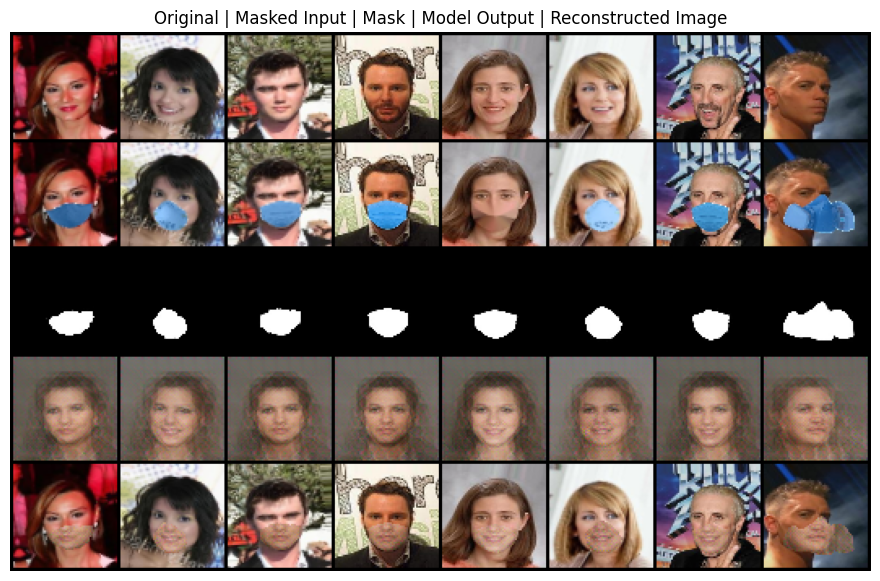

Visualization saved: /kaggle/working/checkpoints_run3/visualizations/epoch_058.png

Epoch 59/82


Validating: 100%|██████████| 40/40 [00:16<00:00,  2.39it/s, total_loss=17.2592, l1_loss=0.4424, recon_loss=0.0251, perceptual_loss=6.4112, psnr=11.8658, ssim=0.3765]


Best model saved: /kaggle/working/checkpoints_run3/best_model.pth

Epoch 60/82


Validating: 100%|██████████| 40/40 [00:16<00:00,  2.42it/s, total_loss=17.1756, l1_loss=0.4358, recon_loss=0.0250, perceptual_loss=6.4024, psnr=11.9879, ssim=0.3769]


Best model saved: /kaggle/working/checkpoints_run3/best_model.pth
Checkpoint saved: /kaggle/working/checkpoints_run3/regular_checkpoint.pth


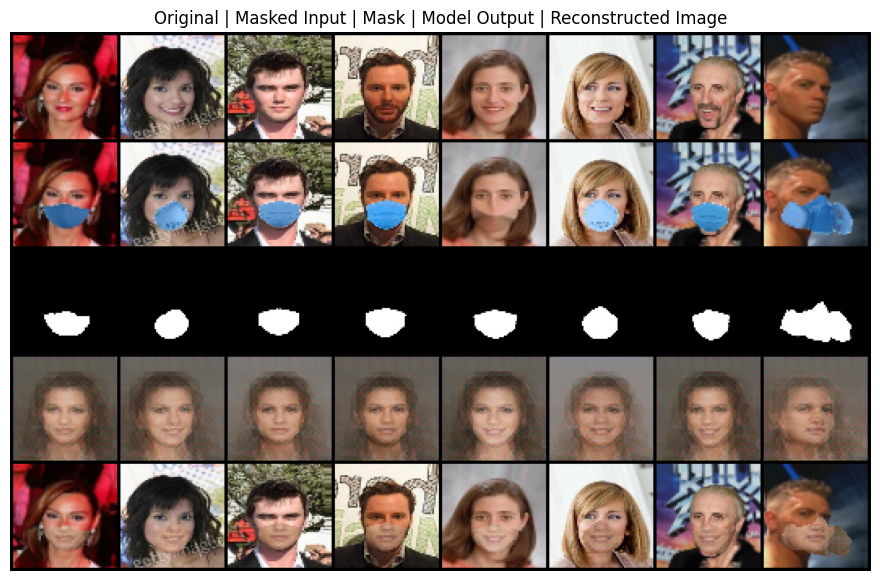

Visualization saved: /kaggle/working/checkpoints_run3/visualizations/epoch_060.png

Epoch 61/82


Validating: 100%|██████████| 40/40 [00:16<00:00,  2.49it/s, total_loss=17.1085, l1_loss=0.4293, recon_loss=0.0250, perceptual_loss=6.4017, psnr=12.0940, ssim=0.3775]


Best model saved: /kaggle/working/checkpoints_run3/best_model.pth

Epoch 62/82


Validating: 100%|██████████| 40/40 [00:16<00:00,  2.45it/s, total_loss=17.0533, l1_loss=0.4232, recon_loss=0.0249, perceptual_loss=6.4044, psnr=12.2210, ssim=0.3783]


Best model saved: /kaggle/working/checkpoints_run3/best_model.pth
Checkpoint saved: /kaggle/working/checkpoints_run3/regular_checkpoint.pth


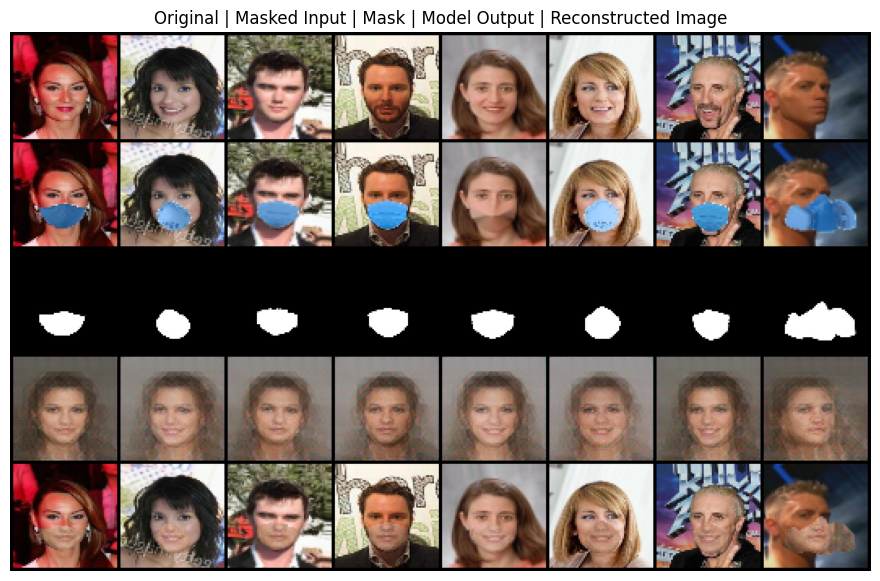

Visualization saved: /kaggle/working/checkpoints_run3/visualizations/epoch_062.png

Epoch 63/82


Validating: 100%|██████████| 40/40 [00:16<00:00,  2.46it/s, total_loss=17.0046, l1_loss=0.4176, recon_loss=0.0246, perceptual_loss=6.4082, psnr=12.2870, ssim=0.3784]


Best model saved: /kaggle/working/checkpoints_run3/best_model.pth

Epoch 64/82


Validating: 100%|██████████| 40/40 [00:16<00:00,  2.42it/s, total_loss=16.9377, l1_loss=0.4105, recon_loss=0.0243, perceptual_loss=6.4101, psnr=12.4174, ssim=0.3799]


Best model saved: /kaggle/working/checkpoints_run3/best_model.pth
Checkpoint saved: /kaggle/working/checkpoints_run3/regular_checkpoint.pth


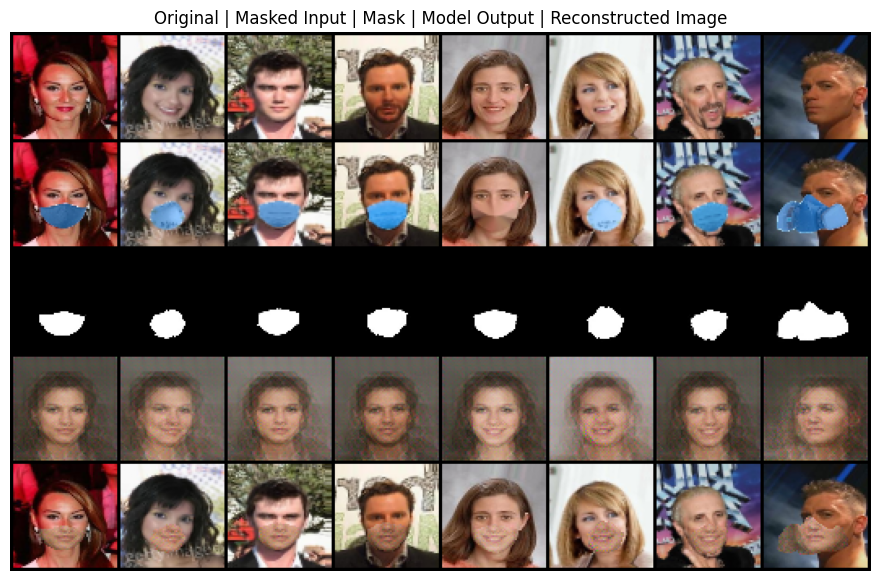

Visualization saved: /kaggle/working/checkpoints_run3/visualizations/epoch_064.png

Epoch 65/82


Validating: 100%|██████████| 40/40 [00:16<00:00,  2.37it/s, total_loss=17.1495, l1_loss=0.4090, recon_loss=0.0259, perceptual_loss=6.5231, psnr=12.4464, ssim=0.3759]



Epoch 66/82


Validating: 100%|██████████| 40/40 [00:17<00:00,  2.34it/s, total_loss=16.8364, l1_loss=0.4019, recon_loss=0.0239, perceptual_loss=6.4027, psnr=12.5522, ssim=0.3831]


Best model saved: /kaggle/working/checkpoints_run3/best_model.pth
Checkpoint saved: /kaggle/working/checkpoints_run3/regular_checkpoint.pth


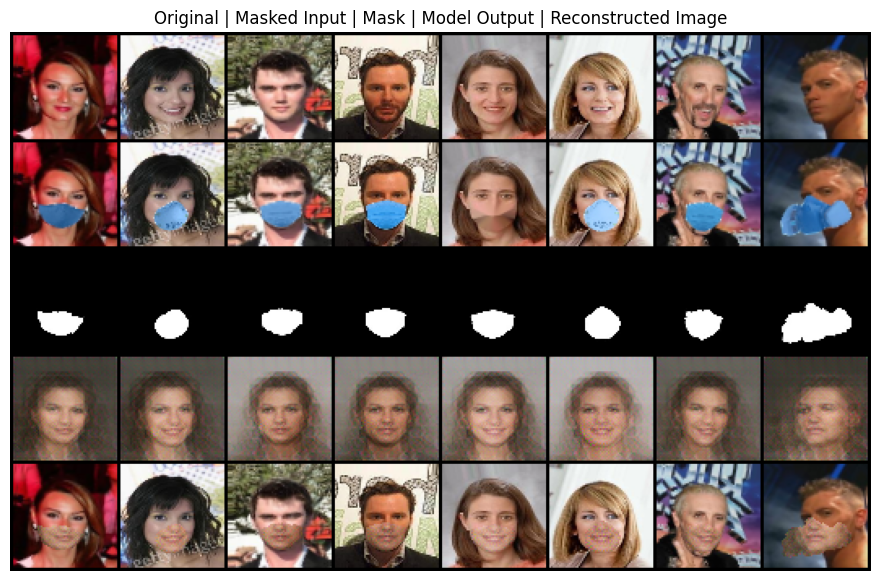

Visualization saved: /kaggle/working/checkpoints_run3/visualizations/epoch_066.png

Epoch 67/82


Validating: 100%|██████████| 40/40 [00:17<00:00,  2.30it/s, total_loss=16.8209, l1_loss=0.4000, recon_loss=0.0239, perceptual_loss=6.4045, psnr=12.5846, ssim=0.3854]


Best model saved: /kaggle/working/checkpoints_run3/best_model.pth

Epoch 68/82


Validating: 100%|██████████| 40/40 [00:17<00:00,  2.34it/s, total_loss=16.7679, l1_loss=0.3959, recon_loss=0.0238, perceptual_loss=6.3985, psnr=12.6750, ssim=0.3867]


Best model saved: /kaggle/working/checkpoints_run3/best_model.pth
Checkpoint saved: /kaggle/working/checkpoints_run3/regular_checkpoint.pth


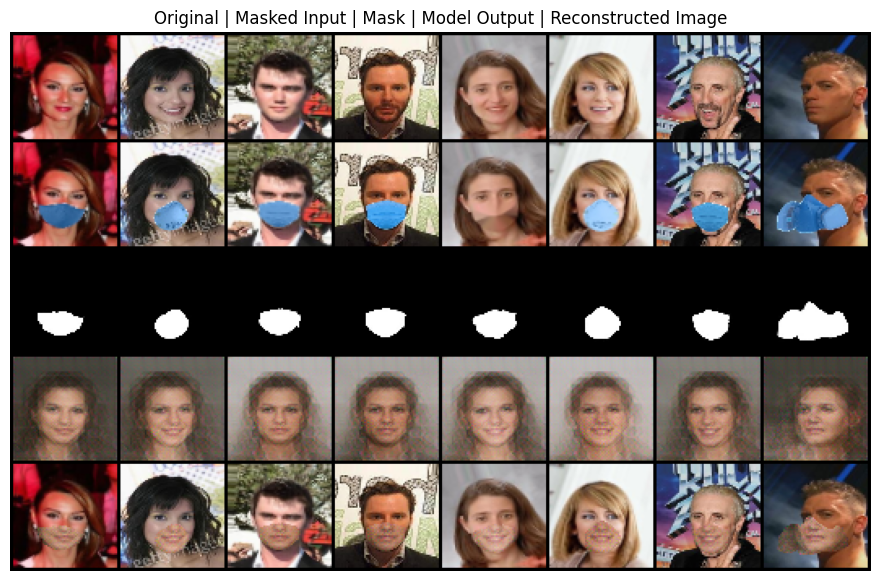

Visualization saved: /kaggle/working/checkpoints_run3/visualizations/epoch_068.png

Epoch 69/82


Validating: 100%|██████████| 40/40 [00:16<00:00,  2.44it/s, total_loss=16.7311, l1_loss=0.3934, recon_loss=0.0235, perceptual_loss=6.3924, psnr=12.7172, ssim=0.3894]


Best model saved: /kaggle/working/checkpoints_run3/best_model.pth

Epoch 70/82


Validating: 100%|██████████| 40/40 [00:17<00:00,  2.35it/s, total_loss=16.6967, l1_loss=0.3892, recon_loss=0.0233, perceptual_loss=6.3963, psnr=12.7818, ssim=0.3916]


Best model saved: /kaggle/working/checkpoints_run3/best_model.pth
Checkpoint saved: /kaggle/working/checkpoints_run3/regular_checkpoint.pth


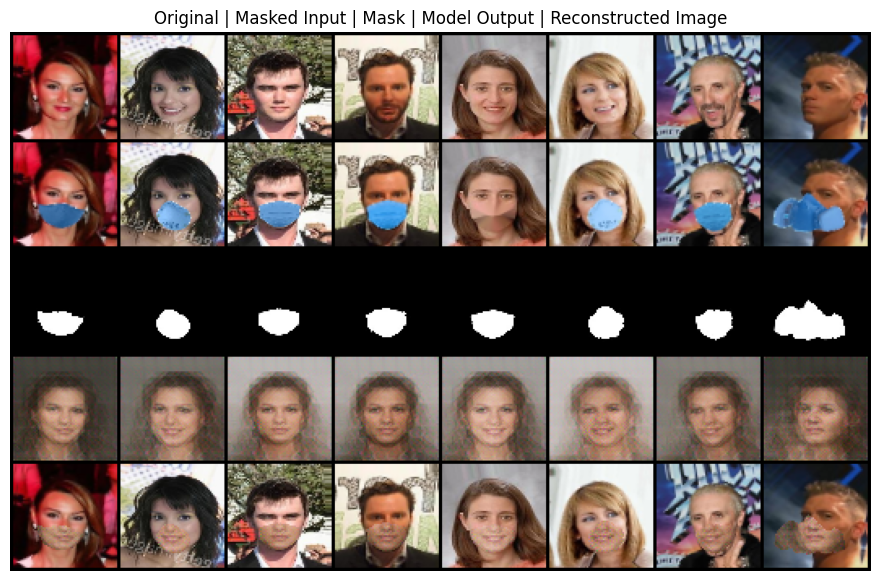

Visualization saved: /kaggle/working/checkpoints_run3/visualizations/epoch_070.png

Epoch 71/82


Validating: 100%|██████████| 40/40 [00:17<00:00,  2.33it/s, total_loss=16.6391, l1_loss=0.3860, recon_loss=0.0231, perceptual_loss=6.3839, psnr=12.8179, ssim=0.3937]


Best model saved: /kaggle/working/checkpoints_run3/best_model.pth

Epoch 72/82


Validating: 100%|██████████| 40/40 [00:17<00:00,  2.32it/s, total_loss=16.6357, l1_loss=0.3856, recon_loss=0.0233, perceptual_loss=6.3841, psnr=12.8459, ssim=0.3954]


Best model saved: /kaggle/working/checkpoints_run3/best_model.pth
Checkpoint saved: /kaggle/working/checkpoints_run3/regular_checkpoint.pth


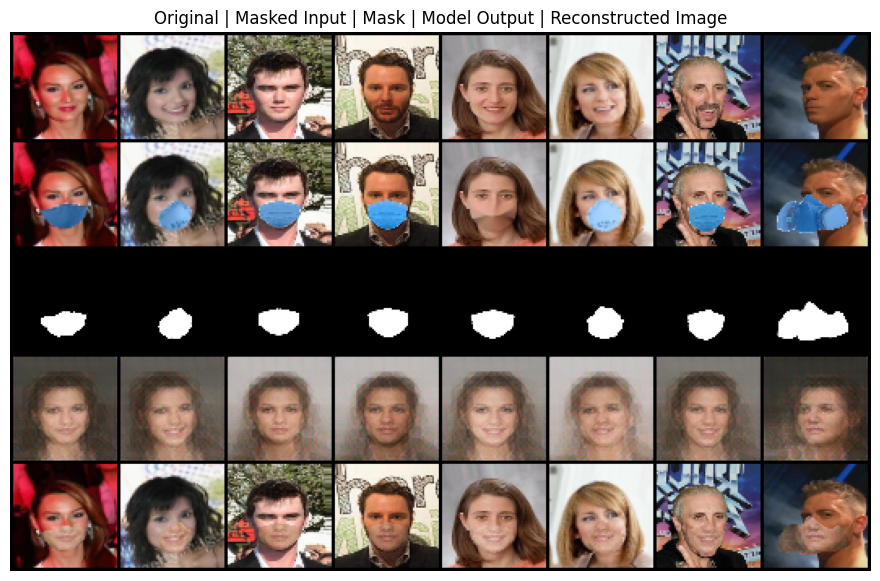

Visualization saved: /kaggle/working/checkpoints_run3/visualizations/epoch_072.png

Epoch 73/82


Validating: 100%|██████████| 40/40 [00:17<00:00,  2.27it/s, total_loss=16.6058, l1_loss=0.3833, recon_loss=0.0230, perceptual_loss=6.3808, psnr=12.8594, ssim=0.3974]


Best model saved: /kaggle/working/checkpoints_run3/best_model.pth

Epoch 74/82


Validating: 100%|██████████| 40/40 [00:16<00:00,  2.43it/s, total_loss=16.5777, l1_loss=0.3805, recon_loss=0.0227, perceptual_loss=6.3806, psnr=12.9345, ssim=0.3980]


Best model saved: /kaggle/working/checkpoints_run3/best_model.pth
Checkpoint saved: /kaggle/working/checkpoints_run3/regular_checkpoint.pth


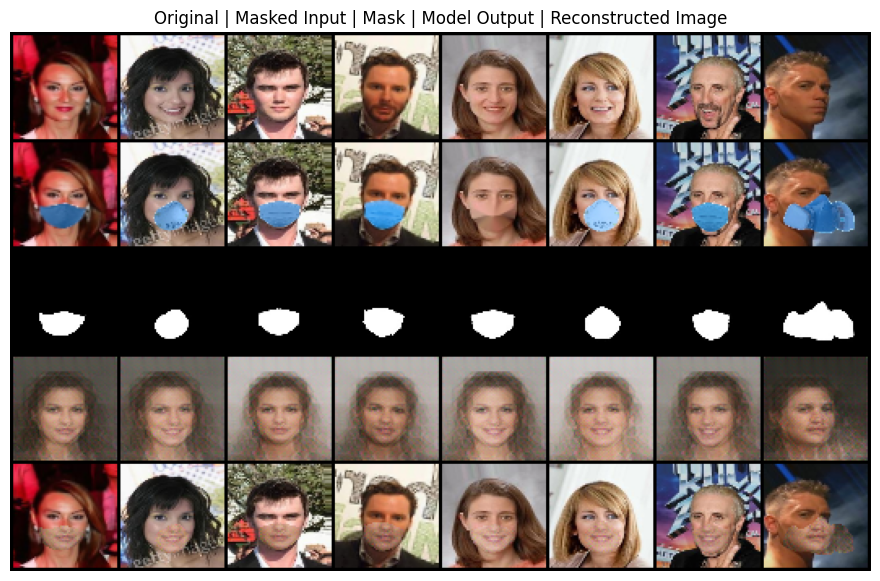

Visualization saved: /kaggle/working/checkpoints_run3/visualizations/epoch_074.png

Epoch 75/82


Validating: 100%|██████████| 40/40 [00:16<00:00,  2.39it/s, total_loss=16.5471, l1_loss=0.3799, recon_loss=0.0225, perceptual_loss=6.3683, psnr=12.9507, ssim=0.4000]


Best model saved: /kaggle/working/checkpoints_run3/best_model.pth

Epoch 76/82


Validating: 100%|██████████| 40/40 [00:16<00:00,  2.45it/s, total_loss=16.5258, l1_loss=0.3771, recon_loss=0.0224, perceptual_loss=6.3718, psnr=12.9681, ssim=0.4015]


Best model saved: /kaggle/working/checkpoints_run3/best_model.pth
Checkpoint saved: /kaggle/working/checkpoints_run3/regular_checkpoint.pth


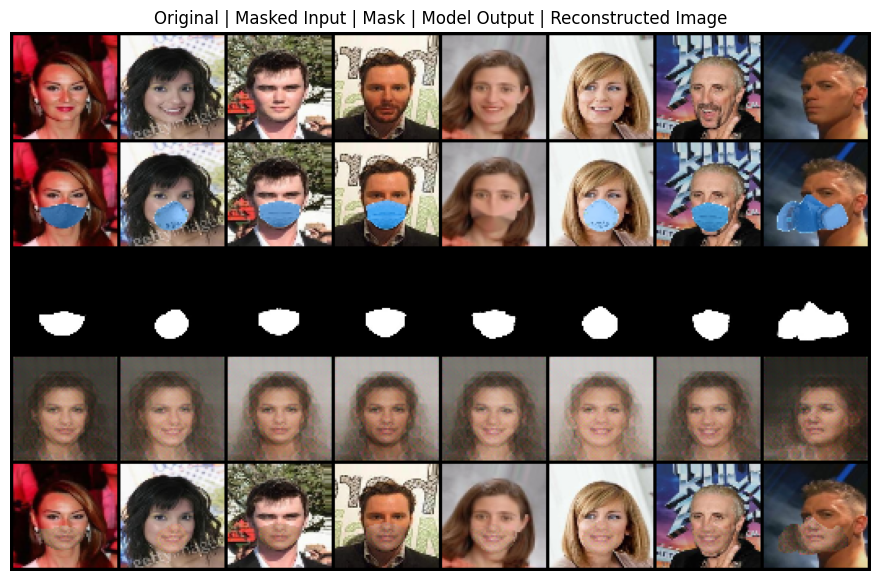

Visualization saved: /kaggle/working/checkpoints_run3/visualizations/epoch_076.png

Epoch 77/82


Validating: 100%|██████████| 40/40 [00:16<00:00,  2.41it/s, total_loss=16.5717, l1_loss=0.3799, recon_loss=0.0224, perceptual_loss=6.3807, psnr=12.9413, ssim=0.4012]



Epoch 78/82


Validating: 100%|██████████| 40/40 [00:17<00:00,  2.35it/s, total_loss=16.5144, l1_loss=0.3758, recon_loss=0.0224, perceptual_loss=6.3728, psnr=13.0097, ssim=0.4043]


Best model saved: /kaggle/working/checkpoints_run3/best_model.pth
Checkpoint saved: /kaggle/working/checkpoints_run3/regular_checkpoint.pth


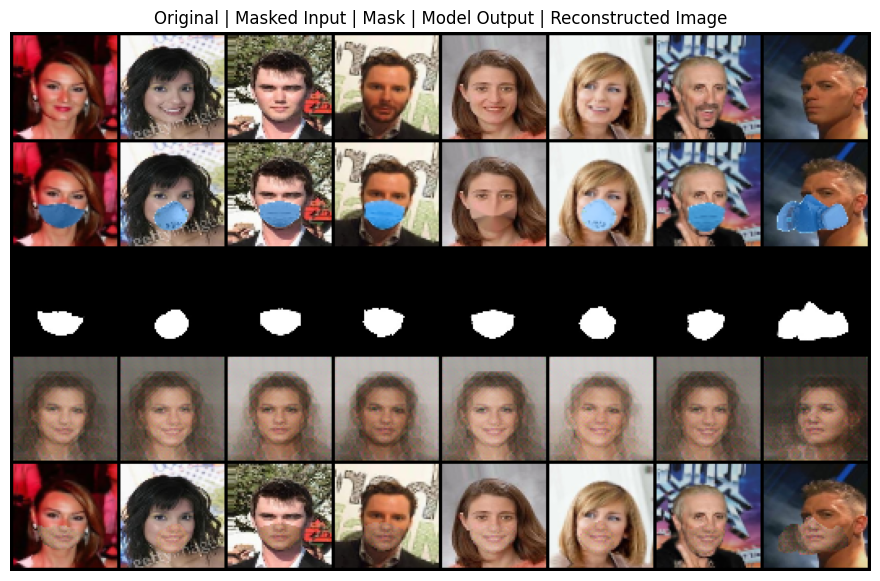

Visualization saved: /kaggle/working/checkpoints_run3/visualizations/epoch_078.png

Epoch 79/82


Validating: 100%|██████████| 40/40 [00:17<00:00,  2.32it/s, total_loss=16.4748, l1_loss=0.3733, recon_loss=0.0223, perceptual_loss=6.3656, psnr=12.9999, ssim=0.4046]


Best model saved: /kaggle/working/checkpoints_run3/best_model.pth

Epoch 80/82


Validating: 100%|██████████| 40/40 [00:16<00:00,  2.40it/s, total_loss=16.4649, l1_loss=0.3730, recon_loss=0.0222, perceptual_loss=6.3621, psnr=13.0357, ssim=0.4053]


Best model saved: /kaggle/working/checkpoints_run3/best_model.pth
Checkpoint saved: /kaggle/working/checkpoints_run3/regular_checkpoint.pth


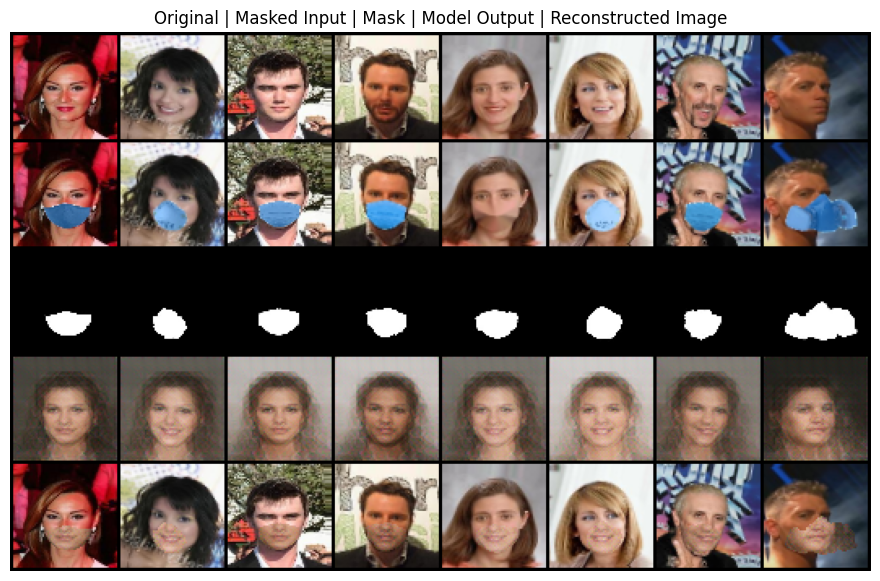

Visualization saved: /kaggle/working/checkpoints_run3/visualizations/epoch_080.png

Epoch 81/82


Validating: 100%|██████████| 40/40 [00:17<00:00,  2.32it/s, total_loss=16.4838, l1_loss=0.3727, recon_loss=0.0223, perceptual_loss=6.3727, psnr=13.0189, ssim=0.4053]



Epoch 82/82


Validating: 100%|██████████| 40/40 [00:16<00:00,  2.38it/s, total_loss=16.4596, l1_loss=0.3722, recon_loss=0.0221, perceptual_loss=6.3634, psnr=13.0554, ssim=0.4059]



Training metrics:
total_loss: 16.4390
l1_loss: 0.3708
recon_loss: 0.0222
perceptual_loss: 6.3598
psnr: 13.0333
ssim: 0.4062

Validation metrics:
total_loss: 16.4596
l1_loss: 0.3722
recon_loss: 0.0221
perceptual_loss: 6.3634
psnr: 13.0554
ssim: 0.4059
Best model saved: /kaggle/working/checkpoints_run3/best_model.pth
Checkpoint saved: /kaggle/working/checkpoints_run3/regular_checkpoint.pth


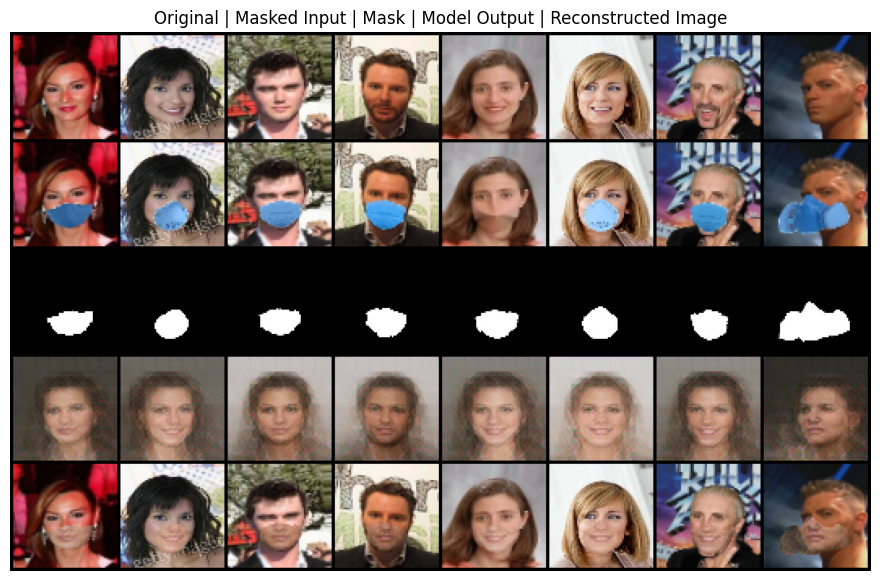

Visualization saved: /kaggle/working/checkpoints_run3/visualizations/epoch_082.png
Final model saved: /kaggle/working/checkpoints_run3/final_model.pth
Training log saved to /kaggle/working/checkpoints_run3/training_log.csv


In [20]:
# Initialize models
unet = PDUNet(in_channels=4, out_channels=3).to('cuda')
# Optimizers
optimizer = optim.Adam(unet.parameters(), lr=1e-5, betas=(0.9, 0.999))

# Initialize trainer
trainer = InpaintingTrainer(
    unet=unet,
    device='cuda',
    lambda_l1=10.0,
    lambda_recon=0.5,
    lambda_perceptual=2.0
)

# Train model
train_model(
    trainer=trainer,
    train_loader=train_loader,
    val_loader=val_loader,
    optimizer=optimizer,
    num_epochs=30,
    save_dir='/kaggle/working/checkpoints_run3',
    save_freq=2,
    viz_freq=2,
    resume_path = '/kaggle/working/checkpoints_run2/best_model.pth'
)

In [ ]:
def visualize_inpainting_results(trainer, dataloader, checkpoint_path, num_images=4, device='cuda'):
    """
    Visualizes original image, ground truth, binary mask, model output, and reconstructed image.

    Args:
        trainer: InpaintingTrainer instance.
        dataloader: DataLoader for visualization.
        checkpoint_path: Path to the model checkpoint.
        num_images: Number of images to visualize.
        device: Device ('cuda' or 'cpu').

    """
    # Load checkpoint
    trainer.load_checkpoint(checkpoint_path)

    trainer.generator.eval()

    # Get a random batch
    batch = next(iter(dataloader))
    real_images = batch['image'][:num_images].to(device)
    masked_inputs = batch['masked_input'][:num_images].to(device)
    masks = batch['mask'][:num_images].float().to(device) / 255.0

    # Generate outputs
    with torch.no_grad():
        fake_images = trainer.generator(masked_inputs, masks)

    # Reconstruct image (real + inpainted)
    masks_expanded = masks.expand_as(real_images)
    reconstructed_images = real_images * (1 - masks_expanded) + fake_images * masks_expanded

    # Denormalize for visualization
    def denorm(x):
        return (x + 1) / 2

    real_images = denorm(real_images)
    masked_inputs = denorm(masked_inputs[:, :3, :, :])  # Extract only the RGB part
    fake_images = denorm(fake_images)
    reconstructed_images = denorm(reconstructed_images)
    masks_vis = masks.repeat(1, 3, 1, 1)  # Convert masks to 3 channels for visualization

    # Create visualization grid
    vis_images = torch.cat([
        real_images,
        masked_inputs,
        masks_vis,
        fake_images,
        reconstructed_images
    ], dim=0)

    grid = make_grid(vis_images, nrow=num_images, padding=5, normalize=False)

    # Plot the grid
    plt.figure(figsize=(15, 8))
    plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
    plt.axis('off')
    plt.title("Original | Masked Input | Mask | Model Output | Reconstructed Image")
    plt.show()

In [ ]:
visualize_inpainting_results(trainer, val_loader, '/kaggle/working/training_runs/run_1/best_model.pth')